<a href="https://colab.research.google.com/github/iremcamurlu/nycairbnbsubway/blob/main/Group_1_FINALREPORT.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# NYC SUBWAY SYSTEM AND PEOPLE - Group#1

Group Members:

Nazlı İrem Çamurlu


Mehmet Akif Gültekin

## Introduction

<font color="magenta">
In this project,our aim is to implement machine learning and data visualization techniques to airbnb dataset of NYC,subway system data of NYC and the events dataset of NYC.We wanted to show the correlation between prices and location,prices and reviews of airbnbs, the distribution of prices according to boroughs... with the help of the additional datasets. We wanted to implement machine learning techniques mostly for the "price" label of our airbnb dataset and trained our data according to it.Another machine learning techineque that we used is clustering for to be able to see the distribution of the locations of subways and events.
</font>

### Problem Definition

---



---



<font color="red">
Our main goal is to predict and find what parameters could be the reason behind the change in the prices of airbnbs? .Another problem we want to implement using machine learning techniques is to predict and see whether the number of reviews have been affected from the prices of airbnbs?And is it possible to predict the number of reviews of airbnbs from looking at the prices?We also want to see where mainly if the locations of the events of NYC and the locations of the airbns are clustered similarly or not by using k-means clustering.We then want to compare the clustered locations with the clustered locations of subways and see if these parameters are clustered similarly and if they are affected or sufficient to each other.
</font>

### Utilized Datasets

<font color="pink">
The airbnb dataset contains the airbnb data of NYC with 16 different parameters such as price,reviews per month,room types,latitude,longitude if we want to highlight some of them.The subway data contains the exact geographical locations(latitude,longitude) of NYC subway entrances.The events dataset contains event names,addresses,borough and latitude,longitude of events that take place in NYC.



*   Events of NYC:  
New York city events for 6 years between 2013 to 2019. https://data.cityofnewyork.us/PublicSafety/Ready-NY-Events/hyur-qpyf/data
*   Subway Enterances:

  All Subway Entrances through the city. https://data.cityofnewyork.us/Transportation/SubwayEntrances/drex-xx56

*   AirBnb 

In [ ]:
from google.colab import drive
drive.mount("/content/drive", force_remount=True)

path_prefix = "/content/drive/My Drive"

Go to this URL in a browser: https://accounts.google.com/o/oauth2/auth?client_id=947318989803-6bn6qk8qdgf4n4g3pfee6491hc0brc4i.apps.googleusercontent.com&redirect_uri=urn%3aietf%3awg%3aoauth%3a2.0%3aoob&response_type=code&scope=email%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdocs.test%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive.photos.readonly%20https%3a%2f%2fwww.googleapis.com%2fauth%2fpeopleapi.readonly

Enter your authorization code:
··········
Mounted at /content/drive


In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from scipy import stats
from scipy import special

from os.path import join

import warnings 
warnings.simplefilter('ignore')

%matplotlib inline

/usr/local/lib/python3.6/dist-packages/statsmodels/tools/_testing.py:19: FutureWarning: pandas.util.testing is deprecated. Use the functions in the public API at pandas.testing instead.
  import pandas.util.testing as tm


In [ ]:
events = pd.read_csv(join(path_prefix, "Ready_NY_Events.csv"), index_col=False)
events.head()


,Event Date,Type,Event,Location,Address,Borough,Postcode,Latitude,Longitude,Community Board,Council District,Census Tract,BIN,BBL,NTA
0,6/30/2016,NaN,Citizen Preparedness Training,Christian Heritage Church,4121 Avenue J,Brooklyn,11210.0,40.627657,-73.936235,18.0,45.0,734,3215070.0,3.077670e+09,Flatlands
1,6/29/2016,NaN,RNY General Presentation,10 Gregg Place,10 Gregg Place,Staten Island,10301.0,40.632097,-74.099455,1.0,49.0,67,5003236.0,5.001310e+09,New Brighton-Silver Lake
2,6/29/2016,NaN,Bring Your Kids to Work Day,Governor's Office of Storm Recovery,"25 Beaver Street, 5th Floor",Manhattan,10004.0,40.704983,-74.012046,1.0,1.0,9,1000817.0,1.000240e+09,Battery Park City-Lower Manhattan
3,6/29/2016,NaN,Emergency Preparedness Presentation,The Axis Project,1325 Fifth Ave,Manhattan,10029.0,40.797706,-73.948608,11.0,9.0,"17,402",1086046.0,1.016170e+09,East Harlem South
4,6/29/2016,NaN,Ready NY for Nursing Students,NYC EM Situation Room,165 Cadman Plaza East,Brooklyn,11201.0,40.698767,-73.989870,2.0,33.0,13,3000172.0,3.000850e+09,DUMBO-Vinegar Hill-Downtown Brooklyn-Boerum Hill


<font color='cyan'>We only need the location details and event dates so we drop the other columns that are not needed.

In [ ]:
events=events[["Event Date","Event","Location","Address","Borough","Postcode","Latitude","Longitude"]]
events.dropna(subset=["Latitude"],inplace=True)
events.dropna(subset=["Longitude"],inplace=True)
events=events.reset_index()
events.head()

,index,Event Date,Event,Location,Address,Borough,Postcode,Latitude,Longitude
0,0,6/30/2016,Citizen Preparedness Training,Christian Heritage Church,4121 Avenue J,Brooklyn,11210.0,40.627657,-73.936235
1,1,6/29/2016,RNY General Presentation,10 Gregg Place,10 Gregg Place,Staten Island,10301.0,40.632097,-74.099455
2,2,6/29/2016,Bring Your Kids to Work Day,Governor's Office of Storm Recovery,"25 Beaver Street, 5th Floor",Manhattan,10004.0,40.704983,-74.012046
3,3,6/29/2016,Emergency Preparedness Presentation,The Axis Project,1325 Fifth Ave,Manhattan,10029.0,40.797706,-73.948608
4,4,6/29/2016,Ready NY for Nursing Students,NYC EM Situation Room,165 Cadman Plaza East,Brooklyn,11201.0,40.698767,-73.989870


<font color="red">We have pre-separated the longitude and latitude of the subway locations into two different parameters to be able to further use it in machine learning.

In [ ]:
subway1 = pd.read_csv(join(path_prefix, "SUBWAY_ENTRANCE.csv"))
subway1.head()

,OBJECTID,URL,NAME,the_geom,Station longitude,Station latitude,LINE
0,"1,734",http://web.mta.info/nyct/service/,Birchall Ave & Sagamore St at NW corner,NaN,-73.868356,40.849169,5-Feb
1,"1,735",http://web.mta.info/nyct/service/,Birchall Ave & Sagamore St at NE corner,NaN,-73.868213,40.849128,5-Feb
2,"1,736",http://web.mta.info/nyct/service/,Morris Park Ave & 180th St at NW corner,NaN,-73.873499,40.841223,5-Feb
3,"1,737",http://web.mta.info/nyct/service/,Morris Park Ave & 180th St at NW corner,NaN,-73.872892,40.841453,5-Feb
4,"1,738",http://web.mta.info/nyct/service/,Boston Rd & 178th St at SW corner,NaN,-73.879623,40.840815,5-Feb


In [ ]:
subway = pd.read_csv(join(path_prefix, "DOITT_SUBWAY_ENTRANCE.csv"))
subway.head()

,OBJECTID,URL,NAME,the_geom,LINE
0,"1,734",http://web.mta.info/nyct/service/,Birchall Ave & Sagamore St at NW corner,POINT (-73.86835600032798 40.84916900104506),5-Feb
1,"1,735",http://web.mta.info/nyct/service/,Birchall Ave & Sagamore St at NE corner,POINT (-73.86821300022677 40.84912800131844),5-Feb
2,"1,736",http://web.mta.info/nyct/service/,Morris Park Ave & 180th St at NW corner,POINT (-73.87349900050798 40.84122300105249),5-Feb
3,"1,737",http://web.mta.info/nyct/service/,Morris Park Ave & 180th St at NW corner,POINT (-73.8728919997833 40.84145300067447),5-Feb
4,"1,738",http://web.mta.info/nyct/service/,Boston Rd & 178th St at SW corner,POINT (-73.87962300013866 40.84081500075867),5-Feb


<font color = "red">We have removed the column of URL as we won't be using it.

In [ ]:
subway = subway.drop(columns="URL")
subway

,OBJECTID,NAME,the_geom,LINE
0,"1,734",Birchall Ave & Sagamore St at NW corner,POINT (-73.86835600032798 40.84916900104506),5-Feb
1,"1,735",Birchall Ave & Sagamore St at NE corner,POINT (-73.86821300022677 40.84912800131844),5-Feb
2,"1,736",Morris Park Ave & 180th St at NW corner,POINT (-73.87349900050798 40.84122300105249),5-Feb
3,"1,737",Morris Park Ave & 180th St at NW corner,POINT (-73.8728919997833 40.84145300067447),5-Feb
4,"1,738",Boston Rd & 178th St at SW corner,POINT (-73.87962300013866 40.84081500075867),5-Feb
...,...,...,...,...
1923,"1,928",2nd Ave & bet 83rd & 84th St,POINT (-73.95281423699555 40.77618770946792),Q
1924,"1,929",2nd Ave & 96th St at SW corner,POINT (-73.94747299691045 40.784098884955554),Q
1925,"1,930",2nd Ave & 95th St at NW corner,POINT (-73.94761889814153 40.783916088309326),Q
1926,"1,931",2nd Ave & 94th St at NE corner,POINT (-73.94772938539093 40.78292438898596),Q


In [ ]:
airbnb = pd.read_csv(join(path_prefix, "AB_NYC_2019.csv"), index_col=False)
airbnb.head()

,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365
0,2539,Clean & quiet apt home by the park,2787,John,Brooklyn,Kensington,40.64749,-73.97237,Private room,149,1,9,10/19/2018,0.21,6,365
1,2595,Skylit Midtown Castle,2845,Jennifer,Manhattan,Midtown,40.75362,-73.98377,Entire home/apt,225,1,45,5/21/2019,0.38,2,355
2,3647,THE VILLAGE OF HARLEM....NEW YORK !,4632,Elisabeth,Manhattan,Harlem,40.80902,-73.94190,Private room,150,3,0,NaN,NaN,1,365
3,3831,Cozy Entire Floor of Brownstone,4869,LisaRoxanne,Brooklyn,Clinton Hill,40.68514,-73.95976,Entire home/apt,89,1,270,7/5/2019,4.64,1,194
4,5022,Entire Apt: Spacious Studio/Loft by central park,7192,Laura,Manhattan,East Harlem,40.79851,-73.94399,Entire home/apt,80,10,9,11/19/2018,0.10,1,0


<font color ='cyan'> We dropped the NAN values to be able to work with the data easier.

In [ ]:
airbnb = airbnb.loc[~airbnb["price"].isna()]
airbnb = airbnb.loc[~airbnb["number_of_reviews"].isna()]
airbnb = airbnb.loc[~airbnb["reviews_per_month"].isna()]
airbnb 

,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365
0,2539,Clean & quiet apt home by the park,2787,John,Brooklyn,Kensington,40.64749,-73.97237,Private room,149,1,9,10/19/2018,0.21,6,365
1,2595,Skylit Midtown Castle,2845,Jennifer,Manhattan,Midtown,40.75362,-73.98377,Entire home/apt,225,1,45,5/21/2019,0.38,2,355
3,3831,Cozy Entire Floor of Brownstone,4869,LisaRoxanne,Brooklyn,Clinton Hill,40.68514,-73.95976,Entire home/apt,89,1,270,7/5/2019,4.64,1,194
4,5022,Entire Apt: Spacious Studio/Loft by central park,7192,Laura,Manhattan,East Harlem,40.79851,-73.94399,Entire home/apt,80,10,9,11/19/2018,0.10,1,0
5,5099,Large Cozy 1 BR Apartment In Midtown East,7322,Chris,Manhattan,Murray Hill,40.74767,-73.97500,Entire home/apt,200,3,74,6/22/2019,0.59,1,129
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
48782,36425863,Lovely Privet Bedroom with Privet Restroom,83554966,Rusaa,Manhattan,Upper East Side,40.78099,-73.95366,Private room,129,1,1,7/7/2019,1.00,1,147
48790,36427429,No.2 with queen size bed,257683179,H Ai,Queens,Flushing,40.75104,-73.81459,Private room,45,1,1,7/7/2019,1.00,6,339
48799,36438336,Seas The Moment,211644523,Ben,Staten Island,Great Kills,40.54179,-74.14275,Private room,235,1,1,7/7/2019,1.00,1,87
48805,36442252,1B-1B apartment near by Metro,273841667,Blaine,Bronx,Mott Haven,40.80787,-73.92400,Entire home/apt,100,1,2,7/7/2019,2.00,1,40


<font color ='cyan'> We won't be using any information concerning the name host id and host name so we are dropping these columns

In [ ]:
airbnb=airbnb.drop(columns=["name","host_id","host_name"])
airbnb.dropna(subset=['price'],inplace=True)
airbnb.head()

,id,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365
0,2539,Brooklyn,Kensington,40.64749,-73.97237,Private room,149,1,9,10/19/2018,0.21,6,365
1,2595,Manhattan,Midtown,40.75362,-73.98377,Entire home/apt,225,1,45,5/21/2019,0.38,2,355
3,3831,Brooklyn,Clinton Hill,40.68514,-73.95976,Entire home/apt,89,1,270,7/5/2019,4.64,1,194
4,5022,Manhattan,East Harlem,40.79851,-73.94399,Entire home/apt,80,10,9,11/19/2018,0.10,1,0
5,5099,Manhattan,Murray Hill,40.74767,-73.97500,Entire home/apt,200,3,74,6/22/2019,0.59,1,129


## Data Exploration

<font color="blue">

</font>

#Correlations in the Airbnb data

* What is the correlation between price range and reviews, additionally how does the location affect them? 
* Have the Airbnb reviews increased with the factor of available subway entrances within that area? 
* Has the price range affected the reviews even though the Airbnb was nearby subway entrances? 


##Correlation between price range and reviews:

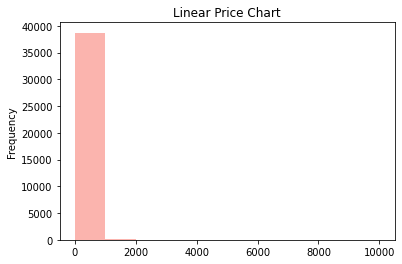

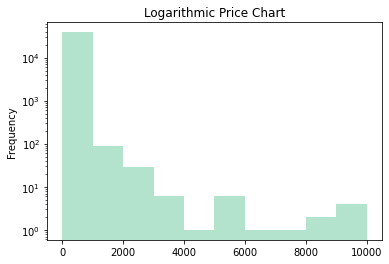


Not clear indentation in prices. So, using logarithmic graph:

count    38843.000000
mean       142.317947
std        196.945624
min          0.000000
25%         69.000000
50%        101.000000
75%        170.000000
max      10000.000000
Name: price, dtype: float64


In [ ]:
price=airbnb["price"]
price.plot.hist(title="Linear Price Chart",colormap="Pastel1")
plt.show()
plt.clf()
price.plot.hist(logy=True ,title="Logarithmic Price Chart",colormap="Pastel2")
plt.show()
print("\nNot clear indentation in prices. So, using logarithmic graph:\n")
print(price.describe())

**We can easily say most of the values are laying between  0\$ and 1000\$.**

#<font color="red">*Is there any relation between prices of airbnbs and reviews?*

Let's first see the correlation between the parameters to make a heat map.

In [ ]:
airbnb_new=airbnb.drop(columns=["latitude","longitude","minimum_nights","calculated_host_listings_count","id"])
airbnb_corr = airbnb_new.corr()
airbnb_corr

,price,number_of_reviews,reviews_per_month,availability_365
price,1.000000,-0.035938,-0.030608,0.078234
number_of_reviews,-0.035938,1.000000,0.549868,0.193557
reviews_per_month,-0.030608,0.549868,1.000000,0.185791
availability_365,0.078234,0.193557,0.185791,1.000000



> **As seen above the correlation between number of reviews and number of reviews per month is negatively correlated with the price meaning as the price increases the reviews decrease.**

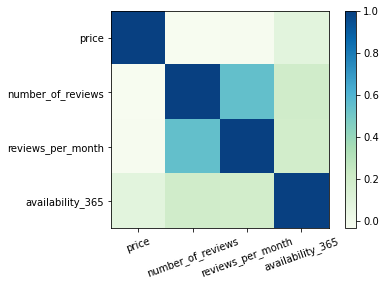

In [ ]:
plt.imshow(airbnb_corr, cmap="GnBu")
plt.colorbar()
plt.xticks(range(len(airbnb_corr)),airbnb_corr.columns, rotation=20)
plt.yticks(range(len(airbnb_corr)),airbnb_corr.index)
plt.show()

#<font color = "pink">Subway Entrances and Airbnb

###Next,we want to see the locations of the subway entrances on the map to better interpret the relation between the subway entrances and the prices of airbnbs:


<font color = "cyan">First we have to strip the latitudes and longitudes from the information 'POINT'

In [ ]:
x=str("POINT (-73.86835600032798 40.84916900104506)")

print(x[x.find('(')+1:x.find(')')])

-73.86835600032798 40.84916900104506


In [ ]:
import folium
from folium.plugins import HeatMap as mp

latitude= airbnb["latitude"].mean()
longitude= airbnb["longitude"].mean()
mapA=folium.Map(location=[latitude,longitude],prefer_canvas=True)

locs=airbnb[["latitude","longitude","price"]]
locations= np.unique(locs,axis=0)

<font color = "blue">Now putting the entrances of subways in red circles;

In [ ]:
def geoTaker(x):
  try:
    loc=str(x)[x.find('(')+1:x.find(')')]
    location=loc.split(' ')
    return location
  except:
    return None


entrances=subway.the_geom.apply(lambda x: geoTaker(x))

for i in entrances:
  if i!=None:
    folium.CircleMarker( location=[ float("{:.6f}".format(float(i[1]))), float("{:.6f}".format(float(i[0])))],    radius=0.7,  color='crimson',    fill=True, fill_color='#000000' ).add_to( mapA )
mapA    

<font color = "pink">Now placing the distribution of prices as a heat map;

In [ ]:

mp(locations, radius=9.3,gradient={.7: 'blue', .85: 'lime', 1: 'red'}).add_to(mapA)
mapA

<font color ='pink'>As seen on the map above even though the prices have increased where the subway entrances were located,there are places that have an increasing price without the subway entrances being nearby so we can conclude that the availability of subway entrances is not the only reason behind the increasing prices.There might be other factors such as the condition of the airbnb,the location of airbnb being close to the touristic attractions etc.

##<font color = "blue">Events and Airbnb 

In [ ]:
events.iloc[:13]

,index,Event Date,Event,Location,Address,Borough,Postcode,Latitude,Longitude
0,0,6/30/2016,Citizen Preparedness Training,Christian Heritage Church,4121 Avenue J,Brooklyn,11210.0,40.627657,-73.936235
1,1,6/29/2016,RNY General Presentation,10 Gregg Place,10 Gregg Place,Staten Island,10301.0,40.632097,-74.099455
2,2,6/29/2016,Bring Your Kids to Work Day,Governor's Office of Storm Recovery,"25 Beaver Street, 5th Floor",Manhattan,10004.0,40.704983,-74.012046
3,3,6/29/2016,Emergency Preparedness Presentation,The Axis Project,1325 Fifth Ave,Manhattan,10029.0,40.797706,-73.948608
4,4,6/29/2016,Ready NY for Nursing Students,NYC EM Situation Room,165 Cadman Plaza East,Brooklyn,11201.0,40.698767,-73.989870
5,5,6/29/2016,Caribbean American Heritage Fair,Brooklyn Borough Hall,209 Joralemon St.,Brooklyn,11201.0,40.692476,-73.990487
6,6,6/28/2016,Hurricane Prep,RAIN Eastchester Senior Center,1246 Burke Avenue,Bronx,10469.0,40.871144,-73.851046
7,7,6/28/2016,National Safety Month,Coney Island Hospital,2601 OCean Parkway,Brooklyn,11235.0,40.586552,-73.966168
8,8,6/27/2016,Emergency Preparedness for Staff,IncludeNYC,"116 E 16 St, 5 Fl",Manhattan,10003.0,40.735480,-73.988280
9,9,6/27/2016,Citizen Preparedness Training,Restoration Temple,4610 Church Ave,Brooklyn,11203.0,40.651565,-73.934053


<font color = "cyan">Placing the locations of events as blue dots on the map:

In [ ]:
mapB=folium.Map(location=[latitude,longitude],prefer_canvas=True)
for i in range(len(events)):
  folium.CircleMarker( location=[events["Latitude"][i],events["Longitude"][i]],    radius=0.7,  color='darkblue',    fill=True, fill_color='#FFF97A' ).add_to( mapB )
mapB

<font color ='cyan'>The events represented as heat map:

In [ ]:
mapC=folium.Map(location=[latitude,longitude],prefer_canvas=True)
location=events[["Latitude","Longitude"]]
event_loc=np.unique(location,axis=0)
mp(event_loc, radius=11,gradient={.5: 'blue', .7: 'lime', .85: 'red',1:'black'}).add_to(mapC)
mapC

#<font color = "bright red">Is there any relation between the increasing prices and the places of events?


In [ ]:
mp(locations, radius=9.3,gradient={.7: 'blue', .85: 'lime', 1: 'red'}).add_to(mapB)
mapB

<font color= 'green'>**As seen above in the map(blue dots representing the events and heat map representing the distribution of prices),we cannot just interpret the increase in the prices with the events that take place.Although in some places there is an increase in prices,it is clearly seen that occurrence of events is not the sole reason in that.**

#<font color="red">Is the subway system of NYC efficient enough for the events that take place in NYC?</font>


In [ ]:
for i in entrances:
  if i!=None:
    folium.CircleMarker( location=[ float("{:.6f}".format(float(i[1]))), float("{:.6f}".format(float(i[0])))],    radius=0.7,  color='magenta',    fill=True, fill_color='#000' ).add_to( mapC )

mapC

<font color="**violet**">As clearly seen on the map above the NYC subway system is not really efficient for the places of the events.Although NYC subway network is one of the world's best subway systems,the events in NYC are not planned according to the subway system as there are no subway stops in the places of events.The subway system mostly requires walking to the places of events from the subway stops.  </font>

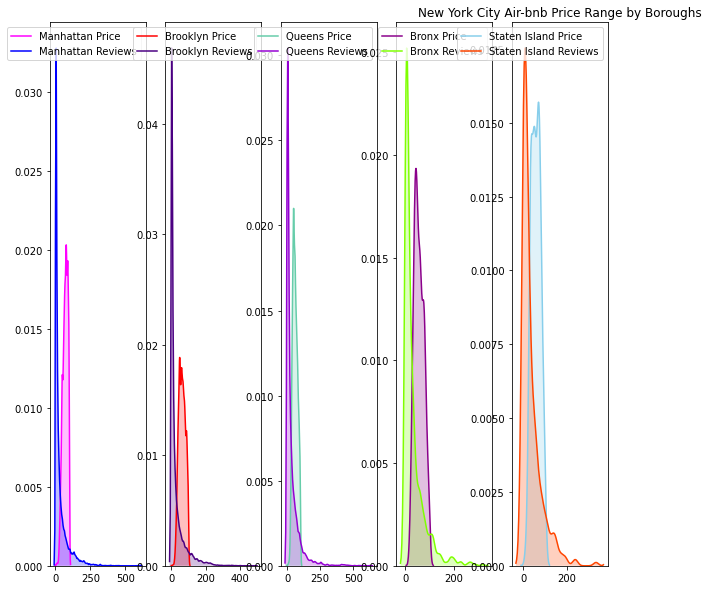

In [ ]:
import seaborn as sns
fig, ax = plt.subplots(1,5, figsize=(10,10))

neighborhood_manhattan = airbnb[airbnb["neighbourhood_group"] == "Manhattan"]["price"]
neighborhood_manhattan_reviews = airbnb[airbnb["neighbourhood_group"] == "Manhattan"]["number_of_reviews"]
neighborhood_brooklyn = airbnb[airbnb["neighbourhood_group"]== "Brooklyn"]["price"]
neighborhood_brooklyn_reviews = airbnb[airbnb["neighbourhood_group"]== "Brooklyn"]["number_of_reviews"]
neighborhood_queens = airbnb[airbnb["neighbourhood_group"]== "Queens"]["price"]
neighborhood_queens_reviews = airbnb[airbnb["neighbourhood_group"]== "Queens"]["number_of_reviews"]
neighborhood_bronx = airbnb[airbnb["neighbourhood_group"]== "Bronx"]["price"]
neighborhood_bronx_reviews = airbnb[airbnb["neighbourhood_group"]== "Bronx"]["number_of_reviews"]
neighborhood_statisland = airbnb[airbnb["neighbourhood_group"]== "Staten Island"]["price"]
neighborhood_statisland_reviews = airbnb[airbnb["neighbourhood_group"]== "Staten Island"]["number_of_reviews"]
sns.kdeplot(neighborhood_manhattan, shade=True, ax=ax[0], label="Manhattan Price",color = "magenta",clip=(0,100))
sns.kdeplot(neighborhood_manhattan_reviews, shade=True, ax=ax[0], label="Manhattan Reviews",color = "blue",)
sns.kdeplot(neighborhood_brooklyn, shade=True, ax=ax[1], label="Brooklyn Price",color = "red",clip=(0,100))
sns.kdeplot(neighborhood_brooklyn_reviews, shade=True, ax=ax[1], label="Brooklyn Reviews",color = "indigo",)
sns.kdeplot(neighborhood_queens, shade=True, ax=ax[2], label="Queens Price",color = "mediumaquamarine",clip=(0,100))
sns.kdeplot(neighborhood_queens_reviews, shade=True, ax=ax[2], label="Queens Reviews",color = "darkviolet")
sns.kdeplot(neighborhood_bronx, shade=True, ax=ax[3], label="Bronx Price",color = "darkmagenta",clip=(0,100))
sns.kdeplot(neighborhood_bronx_reviews, shade=True, ax=ax[3], label="Bronx Reviews",color = "chartreuse")
sns.kdeplot(neighborhood_statisland, shade=True, ax=ax[4], label="Staten Island Price",color = "skyblue",clip=(0,100))
sns.kdeplot(neighborhood_statisland_reviews, shade=True, ax=ax[4], label="Staten Island Reviews",color = "orangered")


plt.title("New York City Air-bnb Price Range by Boroughs")
plt.show()

**As seen on the graphs above increasing prices do not really effect the reviews of airbnbs.Let's look at Staten Island where the price range is visibly more than the other five boroughs.Later on when we calculated the means of the boroughs,it's mean is the third highest but as we see in the graph,Staten Island has a more better distributed price range compared to Manhattan and Brooklyn meaning that some exceptions in Manhattan and Brooklyn increase the mean of the price.Staten Island's reviews despite it's prices being higher compared to others,is higher compared to Bronx or Queens where the prices are much more less compared to Staten Island.People who are planning on renting airbnbs do not just look at the price according to these graphs.Of course Manhattan or Brooklyn will get more reviews compared to Bronx or Queens as the neighborhoods are far more touristic and also seen far more attractive from outside.** 

<font color = 'yellow'>Let's only see the prices of boroughs in separate histograms.

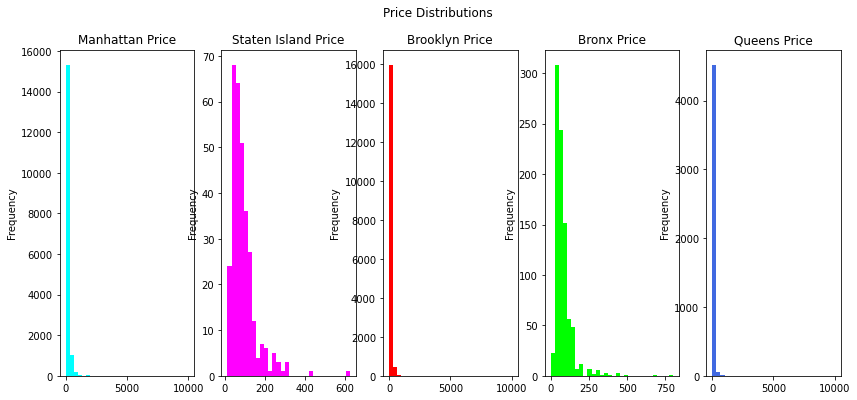

In [ ]:
fig, ax = plt.subplots(1, 5, figsize=(14,6))  # a figure with 1 row and 3 columns
                                              # ax variable stores a list with 3 elements
                                              # each element in ax correspons to chart
        
neighborhood_manhattan.plot(kind="hist", ax=ax[0], bins=30, label="Manhattan Price", color="cyan")
ax[0].set_title("Manhattan Price")

neighborhood_statisland.plot(kind="hist", ax=ax[1], bins=30, label="Staten Island Price", color="magenta")
ax[1].set_title("Staten Island Price")

neighborhood_brooklyn.plot(kind="hist", ax=ax[2], bins=30, label="Brooklyn Price", color="red")
ax[2].set_title("Brooklyn Price")

neighborhood_bronx.plot(kind="hist", ax=ax[3], bins=30, label="Bronx Price", color="lime")
ax[3].set_title("Bronx Price")

neighborhood_queens.plot(kind="hist", ax=ax[4], bins=30, label="Queens Price", color="royalblue")
ax[4].set_title("Queens Price")

plt.suptitle("Price Distributions")
plt.show()

#*Calculated the means to compare the prices of five boroughs in bar chart*

In [ ]:
neighborhood_manhattan_mean = airbnb[airbnb["neighbourhood_group"] == "Manhattan"]["price"].mean()
neighborhood_brooklyn_mean = airbnb[airbnb["neighbourhood_group"] == "Brooklyn"]["price"].mean()
neighborhood_queens_mean = airbnb[airbnb["neighbourhood_group"] == "Queens"]["price"].mean()
neighborhood_statisland_mean = airbnb[airbnb["neighbourhood_group"] == "Staten Island"]["price"].mean()
neighborhood_bronx_mean = airbnb[airbnb["neighbourhood_group"] == "Bronx"]["price"].mean()

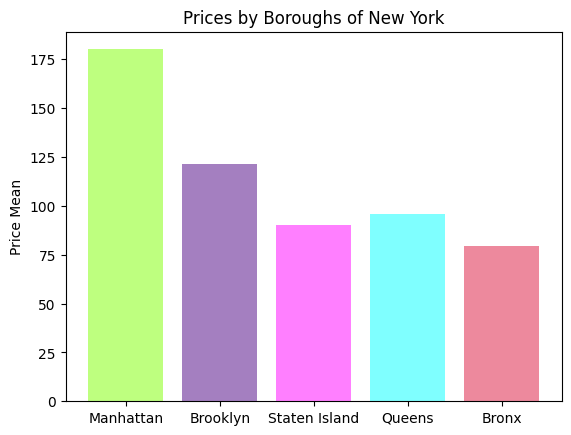

In [ ]:
import matplotlib.pyplot as plt; plt.rcdefaults()
import numpy as np
import matplotlib.pyplot as plt

objects = ('Manhattan', 'Brooklyn', 'Staten Island', 'Queens', 'Bronx')
y_pos = np.arange(len(objects))
means = [neighborhood_manhattan_mean,neighborhood_brooklyn_mean,neighborhood_statisland_mean,neighborhood_queens_mean,neighborhood_bronx_mean]

plt.bar(y_pos, means, align='center', alpha=0.5,color=("chartreuse", "indigo", "magenta", "cyan","crimson"))
plt.xticks(y_pos, objects)
plt.ylabel('Price Mean')
plt.title('Prices by Boroughs of New York')

plt.show()

#*Scatter chart to see better the correlation between the price and the number of reviews*

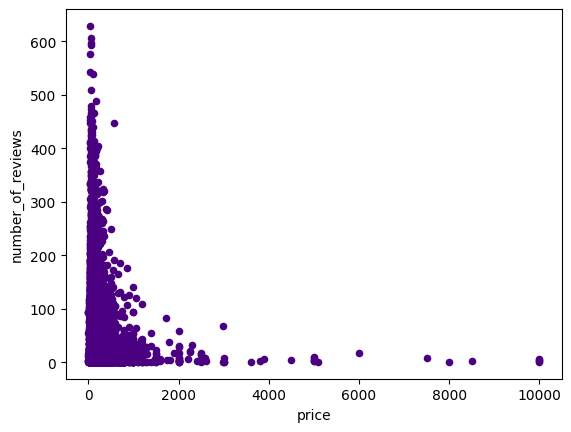

In [ ]:
airbnb.plot(kind='scatter',x='price',y='number_of_reviews',color='indigo')
plt.show()

<font color = 'yellow'>As seen above from the scatter char the number of reviews reaches it's peak point mostly when the prices are lower.

#<font color = 'yellow'>Making new columns based on the room types and neighbourhood group

In [ ]:
def room_type(room_here):#function that adds another column indicating whether the production_countries column contain United States or not
  if "Private room" in room_here:
    return(0)
  elif "Entire home/apt" in room_here:
    return(1)
  elif "Shared room" in room_here:
    return(2)

airbnb["room_type_numeric"]= airbnb["room_type"].apply(room_type)
airbnb

,id,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365,room_type_numeric,borough_numeric
0,2539,Brooklyn,Kensington,40.64749,-73.97237,Private room,149,1,9,10/19/2018,0.21,6,365,0,1
1,2595,Manhattan,Midtown,40.75362,-73.98377,Entire home/apt,225,1,45,5/21/2019,0.38,2,355,1,0
3,3831,Brooklyn,Clinton Hill,40.68514,-73.95976,Entire home/apt,89,1,270,7/5/2019,4.64,1,194,1,1
4,5022,Manhattan,East Harlem,40.79851,-73.94399,Entire home/apt,80,10,9,11/19/2018,0.10,1,0,1,0
5,5099,Manhattan,Murray Hill,40.74767,-73.97500,Entire home/apt,200,3,74,6/22/2019,0.59,1,129,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
48782,36425863,Manhattan,Upper East Side,40.78099,-73.95366,Private room,129,1,1,7/7/2019,1.00,1,147,0,0
48790,36427429,Queens,Flushing,40.75104,-73.81459,Private room,45,1,1,7/7/2019,1.00,6,339,0,2
48799,36438336,Staten Island,Great Kills,40.54179,-74.14275,Private room,235,1,1,7/7/2019,1.00,1,87,0,3
48805,36442252,Bronx,Mott Haven,40.80787,-73.92400,Entire home/apt,100,1,2,7/7/2019,2.00,1,40,1,4


In [ ]:
def neighbourhoodd(borough_):#function that adds another column indicating whether the production_countries column contain United States or not
  if "Manhattan" in borough_:
    return(0)
  elif "Queens" in borough_:
    return(2)
  elif "Bronx" in borough_:
    return(4)
  elif "Brooklyn" in borough_:
    return(1)
  elif "Staten Island" in borough_:
    return(3)
airbnb["borough_numeric"]= airbnb["neighbourhood_group"].apply(neighbourhoodd)
airbnb

,id,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365,room_type_numeric,borough_numeric
0,2539,Brooklyn,Kensington,40.64749,-73.97237,Private room,149,1,9,10/19/2018,0.21,6,365,0,1
1,2595,Manhattan,Midtown,40.75362,-73.98377,Entire home/apt,225,1,45,5/21/2019,0.38,2,355,1,0
3,3831,Brooklyn,Clinton Hill,40.68514,-73.95976,Entire home/apt,89,1,270,7/5/2019,4.64,1,194,1,1
4,5022,Manhattan,East Harlem,40.79851,-73.94399,Entire home/apt,80,10,9,11/19/2018,0.10,1,0,1,0
5,5099,Manhattan,Murray Hill,40.74767,-73.97500,Entire home/apt,200,3,74,6/22/2019,0.59,1,129,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
48782,36425863,Manhattan,Upper East Side,40.78099,-73.95366,Private room,129,1,1,7/7/2019,1.00,1,147,0,0
48790,36427429,Queens,Flushing,40.75104,-73.81459,Private room,45,1,1,7/7/2019,1.00,6,339,0,2
48799,36438336,Staten Island,Great Kills,40.54179,-74.14275,Private room,235,1,1,7/7/2019,1.00,1,87,0,3
48805,36442252,Bronx,Mott Haven,40.80787,-73.92400,Entire home/apt,100,1,2,7/7/2019,2.00,1,40,1,4


<font color = 'cyan'>We dropped the id,neighbourhood,last review columns as it won't be necessary for the correlation.We also dropped the neighbourhood group and room type columns as we already converted them into integer type groups and made new columns.

<font color="magenta">Again making another column to be able to classify the boroughs of NYC using numerical values in the events dataset.

In [ ]:
events = events.loc[~events["Borough"].isna()]

In [ ]:
def neighbourhoodd(borough_):#function that adds another column indicating whether the production_countries column contain United States or not
  if "Manhattan" in borough_:
    return(5)
  elif "Queens" in borough_:
    return(3)
  elif "Bronx" in borough_:
    return(1)
  elif "Brooklyn" in borough_:
    return(4)
  elif "Staten Island" in borough_:
    return(2)
events["borough_numeric"]= events["Borough"].apply(neighbourhoodd)
events

,index,Event Date,Event,Location,Address,Borough,Postcode,Latitude,Longitude,borough_numeric
0,0,6/30/2016,Citizen Preparedness Training,Christian Heritage Church,4121 Avenue J,Brooklyn,11210.0,40.627657,-73.936235,4.0
1,1,6/29/2016,RNY General Presentation,10 Gregg Place,10 Gregg Place,Staten Island,10301.0,40.632097,-74.099455,2.0
2,2,6/29/2016,Bring Your Kids to Work Day,Governor's Office of Storm Recovery,"25 Beaver Street, 5th Floor",Manhattan,10004.0,40.704983,-74.012046,5.0
3,3,6/29/2016,Emergency Preparedness Presentation,The Axis Project,1325 Fifth Ave,Manhattan,10029.0,40.797706,-73.948608,5.0
4,4,6/29/2016,Ready NY for Nursing Students,NYC EM Situation Room,165 Cadman Plaza East,Brooklyn,11201.0,40.698767,-73.989870,4.0
...,...,...,...,...,...,...,...,...,...,...
5126,5933,6/2/2018,Essen Health Care Fair,Park Avenue Thorpe,406 E 184th St,Bronx,10458.0,40.856646,-73.894993,1.0
5127,5934,6/1/2018,Columbus HS Comic Con,Inside Library on 3rd floor.,925 Astor Avenue,Bronx,10469.0,40.859665,-73.861006,1.0
5128,5935,6/1/2018,Bay Eden Health Fair,JASA Bay Eden Senior Center,1220 East 229th Street,Bronx,10466.0,40.884011,-73.842204,1.0
5129,5936,6/1/2018,Middle School Career Day,PS/IS 499,148-20 Reeves Ave\r\nFlushing NY 11367,Queens,11367.0,40.739246,-73.822057,3.0


In [ ]:
new_airbnb = airbnb.drop(columns=["id","neighbourhood","last_review","neighbourhood_group","room_type"])
new_airbnb

,latitude,longitude,price,minimum_nights,number_of_reviews,reviews_per_month,calculated_host_listings_count,availability_365,room_type_numeric,borough_numeric
0,40.64749,-73.97237,149,1,9,0.21,6,365,0,1
1,40.75362,-73.98377,225,1,45,0.38,2,355,1,0
3,40.68514,-73.95976,89,1,270,4.64,1,194,1,1
4,40.79851,-73.94399,80,10,9,0.10,1,0,1,0
5,40.74767,-73.97500,200,3,74,0.59,1,129,1,0
...,...,...,...,...,...,...,...,...,...,...
48782,40.78099,-73.95366,129,1,1,1.00,1,147,0,0
48790,40.75104,-73.81459,45,1,1,1.00,6,339,0,2
48799,40.54179,-74.14275,235,1,1,1.00,1,87,0,3
48805,40.80787,-73.92400,100,1,2,2.00,1,40,1,4


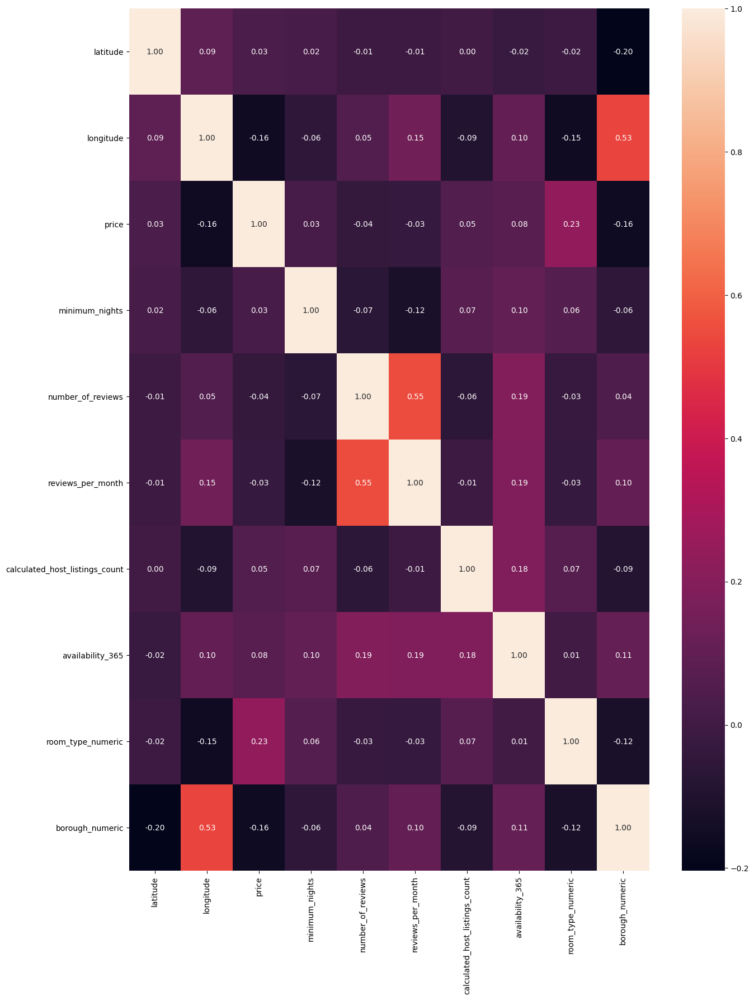

In [ ]:
import pandas as pd
import seaborn as sns
from pylab import rcParams
import matplotlib.pyplot as plt


def plot_correlation(new_airbnb):
    '''
    plot correlation's matrix to explore dependency between features 
    '''
    # init figure size
    rcParams['figure.figsize'] = 15, 20
    fig = plt.figure()
    sns.heatmap(new_airbnb.corr(), annot=True, fmt=".2f")
    plt.show()
    fig.savefig('corr.png')

# load your data 


# plot correlation & densities
plot_correlation(new_airbnb)

<font color = 'brick'>The correlation map shows that there is a strong correlation between the room type and the price.There is negative correlation between calculated host listings count and the number of reviews even though it is small.Another visibly seen correlation is the availability and the host listings count.

## Machine Learning Models

<font color="blue">
This is the section that you primarily need work on for the final report. Implement at least two machine learning models so that you can compare them.
</font>

### Implementation

<font color="blue">
Implement and evaluate your models. Perform hyperparameter tunning if necessary. Choose the correct evaluation metrics.
</font>

#<font color = "bright red">K-Means Clustering to see the clustering to be able to divide our data into clusters according to their "price" parameter.

<font color = 'yellow'>Above elbow method is implemented to be able to see better how many clusters should be to divide our airbnb data according solely to their prices.According to the elbow method the clustering for the prices should be 2 as there is big shift seen in the graph for 2.


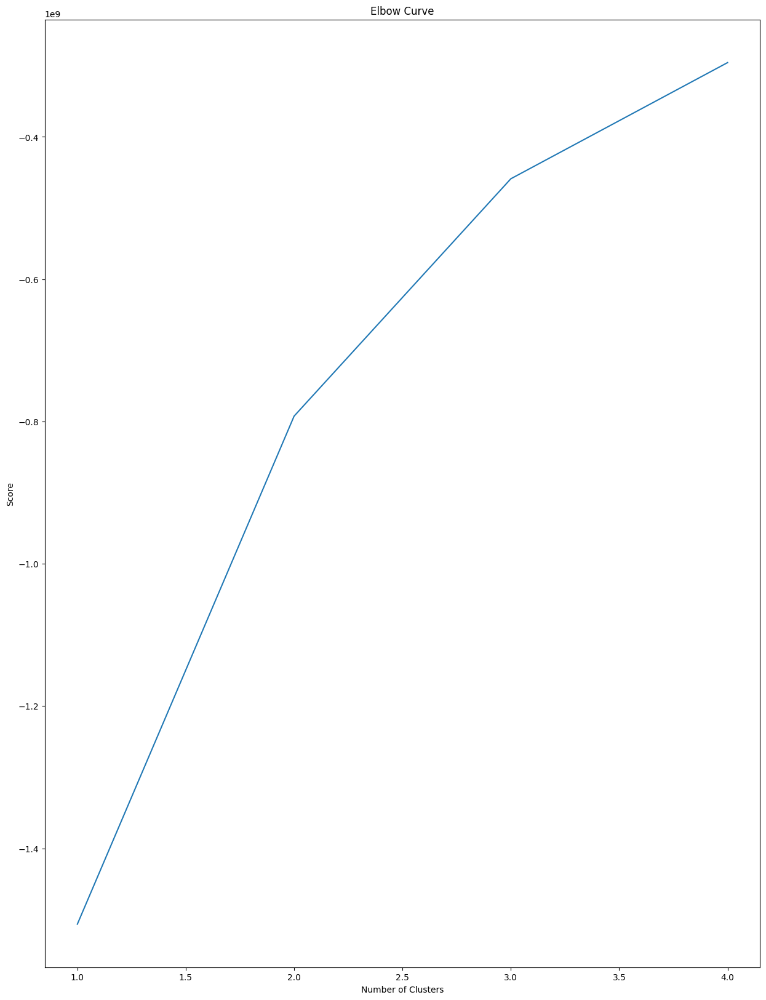

In [ ]:

import pandas
import pylab as pl
from sklearn.cluster import KMeans
from sklearn.decomposition import PCA
X = airbnb.iloc[:, [6]].values
Nc = range(1, 5)
kmeans = [KMeans(n_clusters=i) for i in Nc]
kmeans
score = [kmeans[i].fit(X).score(X) for i in range(len(kmeans))]
score
pl.plot(Nc,score)
pl.xlabel('Number of Clusters')
pl.ylabel('Score')
pl.title('Elbow Curve')
pl.show()


<font color = 'yellow'>Above elbow method is implemented to be able to see better how many clusters should be to divide our airbnb data according solely to their number of reviews.According to the elbow method the clustering for the prices should be 2 as there is big shift seen in the graph for 2.

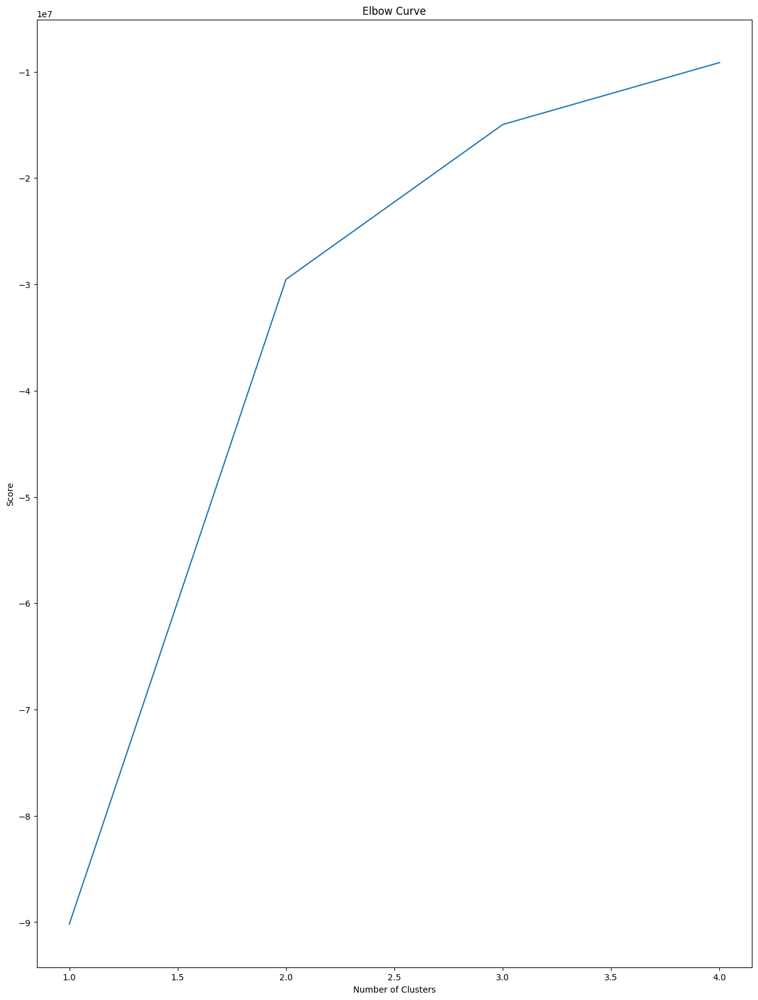

In [ ]:

X = airbnb.iloc[:, [8]].values
Nc = range(1, 5)
kmeans = [KMeans(n_clusters=i) for i in Nc]
kmeans
score = [kmeans[i].fit(X).score(X) for i in range(len(kmeans))]
score
pl.plot(Nc,score)
pl.xlabel('Number of Clusters')
pl.ylabel('Score')
pl.title('Elbow Curve')
pl.show()


<font color = "bright red">Below the k-means clustering is implemented for the price values of the dataset and the center of the clusters can be seen in the output.

In [ ]:

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.cluster import KMeans

x = airbnb.iloc[:, [6]].values
print(x)
kmeans4 = KMeans(n_clusters=2)
y_kmeans4 = kmeans4.fit_predict(x)
print(y_kmeans4)

kmeans4.cluster_centers_

[[149]
 [225]
 [ 89]
 ...
 [235]
 [100]
 [ 30]]
[0 0 0 ... 0 0 0]


array([[ 139.3984546],
       [6439.5      ]])

<font color ="bright red">Below the k-means clustering is implemented for the number of reviews values of the dataset and the center of the clusters can be seen in the output.

In [ ]:

x = airbnb.iloc[:, [8]].values
print(x)
kmeans4 = KMeans(n_clusters=2)
y_kmeans4 = kmeans4.fit_predict(x)
print(y_kmeans4)

kmeans4.cluster_centers_

[[  9]
 [ 45]
 [270]
 ...
 [  1]
 [  2]
 [  1]]
[0 0 1 ... 0 0 0]


array([[ 15.57598661],
       [143.1153386 ]])

<font color = "red">Below,k-means clustering of the price values can be seen.The price values according to the elbow method have been determined to be divided into 2 groups.Also to be able to compare with the number of reviews of the airbnbs later,the index numbers of the airbnbs have been put into two different arrays.

[[ 139.3984546]
 [6439.5      ]]
[0 0 0 ... 0 0 0]
[2563, 3315, 3972, 4002, 4003, 5880, 8014, 10550, 14621, 14642, 21551, 21614, 22336, 25243, 31943, 35365, 35719, 37550]
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127, 128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143, 144, 145, 146, 147, 148, 149, 150, 151, 152, 153, 154, 155, 156, 157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167, 168, 169, 170, 171, 172, 173, 174, 175, 176, 177, 178, 179, 180, 181, 182, 183, 184, 185, 186, 187

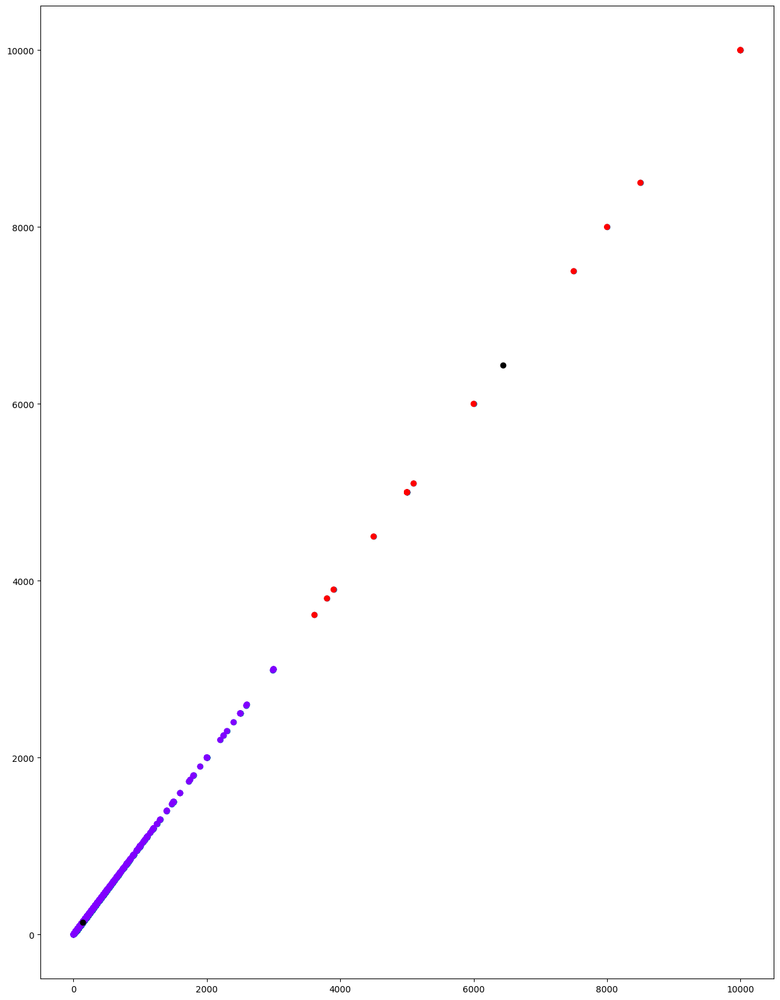

In [ ]:
import numpy as np
from sklearn.cluster import KMeans
import seaborn as sns
import matplotlib.pyplot as plt

import pandas as pd

X = airbnb.iloc[:,[6]].values
plt.scatter(X[:,0],X[:,0], label='True Position')
kmeans = KMeans(n_clusters=2)
kmeans.fit(X)
print(kmeans.cluster_centers_)
print(kmeans.labels_)
plt.scatter(X[:,0],X[:,0], c=kmeans.labels_, cmap='rainbow')
plt.scatter(kmeans.cluster_centers_[:,0] ,kmeans.cluster_centers_[:,0], color='black')


array1_sdw =[]
count = 0
array0_sdw=[]
a= kmeans.labels_
for i in a:
  if(i==1):
    array1_sdw .append(count)
  if(i==0):
    array0_sdw.append(count)
  count=count+1

print(array1_sdw)
print(array0_sdw)

<font color = "red">Below,k-means clustering of the number of reviews values can be seen.These values according to the elbow method have been determined to be divided into 2 groups.Also to be able to compare with the prices of the airbnbs later,the index numbers of the airbnbs have been put into two different arrays.

[[ 15.57598661]
 [143.1153386 ]]
[0 0 1 ... 0 0 0]
[2, 6, 7, 8, 10, 11, 12, 14, 15, 16, 19, 22, 25, 27, 28, 29, 30, 32, 33, 34, 35, 38, 39, 41, 44, 45, 47, 48, 50, 52, 53, 58, 60, 62, 63, 64, 65, 69, 71, 73, 74, 79, 82, 84, 86, 89, 90, 91, 94, 96, 99, 100, 101, 103, 105, 108, 111, 113, 114, 115, 124, 125, 127, 132, 133, 134, 139, 141, 143, 147, 150, 152, 154, 155, 157, 160, 162, 163, 164, 166, 167, 168, 169, 170, 171, 172, 175, 177, 180, 182, 186, 187, 188, 189, 196, 198, 199, 200, 201, 202, 204, 205, 206, 208, 210, 212, 213, 214, 216, 217, 218, 225, 226, 228, 229, 231, 233, 237, 238, 239, 241, 242, 243, 244, 245, 247, 248, 249, 250, 254, 255, 258, 261, 263, 264, 268, 274, 276, 277, 281, 282, 284, 286, 288, 291, 305, 307, 308, 309, 315, 321, 322, 324, 330, 331, 333, 334, 337, 338, 344, 346, 348, 351, 353, 356, 357, 358, 364, 365, 366, 371, 373, 374, 380, 383, 384, 387, 388, 392, 394, 395, 400, 401, 403, 416, 417, 419, 422, 423, 425, 426, 429, 431, 434, 439, 442, 445, 447, 448, 453, 454

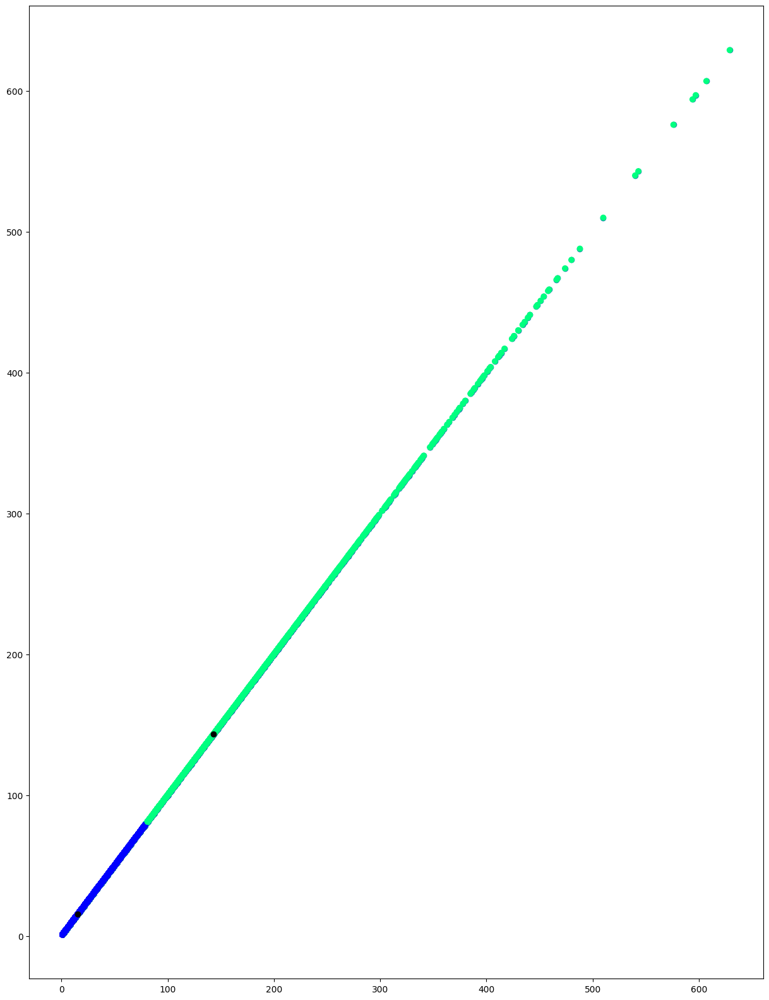

In [ ]:
X = airbnb.iloc[:,[8]].values
plt.scatter(X[:,0],X[:,0], label='True Position')
kmeans = KMeans(n_clusters=2)
kmeans.fit(X)
print(kmeans.cluster_centers_)
print(kmeans.labels_)
plt.scatter(X[:,0],X[:,0], c=kmeans.labels_, cmap='winter')
plt.scatter(kmeans.cluster_centers_[:,0] ,kmeans.cluster_centers_[:,0], color='black')



array1_fqfm =[]
count = 0
array0_fqfm=[]
a= kmeans.labels_
for i in a:
  if(i==1):
    array1_fqfm.append(count)
  if(i==0):
    array0_fqfm.append(count)
  count=count+1

print(array1_fqfm)
print(array0_fqfm)

<font color ="pink">Now to be able to see if these two parameters are correlated with each other,we will take the intersections of the arrays of groups.We will try to intersect group "0" of prices with group "0" of number of reviews,group"1" of prices with group "1" of number of reviews,group "0" of prices with group "1" of number of reviews,group "1" of prices with group "0" of number of reviews.We already know that the prices and number of reviews parameters are negatively correlated.But we want to further see the intersection those high-priced airbnbs and the low views group having many common elements.

In [ ]:

set1 = list(set(array0_sdw) & set( array1_fqfm ) )
set2 = list(set(array0_sdw) & set( array0_fqfm ) )
set3 = list(set(array1_sdw) & set( array0_fqfm ) )
set4 = list(set(array1_sdw) & set( array1_fqfm ) )
print(len(set1))
print(len(set2))
print(len(set3))
print(len(set4))

4179
34646
18
0


<font color ="red">From the output above it is clearly seen that "set2" have many more elements compared to the other sets implemented.The cluster center of the price array in "set2" is the one with the less priced center and the cluster center of the number of reviews in "set2" is the one with the less reviews.So it is clearly seen that these two parameters are not dependent solely on each other.If the data is seen closely and also from the data visualization that we have done before the neighborhood of the airbnb is an important factor on the reviews.But also the set "set1" confirms the cases that the prices were effective on the number of reviews and also "set4" has 0 elements which means the cluster having the most priced houses doesn't have any intersecting elements with the high number parameter."set3" parameter has rather less elements compared to "set1" and "set2" which is the case where some high priced airbnbs had rather more number of reviews.Again there may be other factors attracting the people to look at these houses.

#<font color = "bright red">K-Means Clustering of Prices and Number of Reviews with k = 5

<font color ="cyan">Again first implementing the elbow method for prices and number of reviews

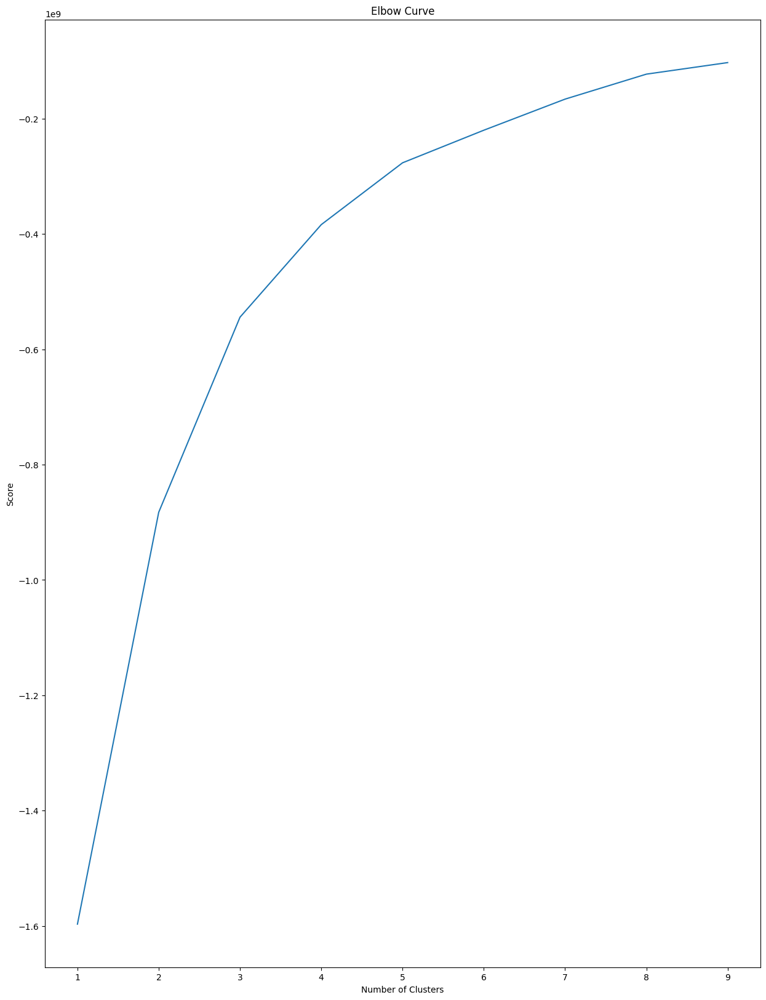

In [ ]:
X = airbnb.iloc[:, [6,8]].values
Nc = range(1, 10)
kmeans = [KMeans(n_clusters=i) for i in Nc]
kmeans
score = [kmeans[i].fit(X).score(X) for i in range(len(kmeans))]
score
pl.plot(Nc,score)
pl.xlabel('Number of Clusters')
pl.ylabel('Score')
pl.title('Elbow Curve')
pl.show()


<font color ="red">From the elbow method above it is better to set the k=5 for our model.

[[149   9]
 [225  45]
 [ 89 270]
 ...
 [235   1]
 [100   2]
 [ 30   1]]
[0 3 0 ... 3 0 0]
[149 225  89 ... 235 100  30]
[  9  45 270 ...   1   2   1]


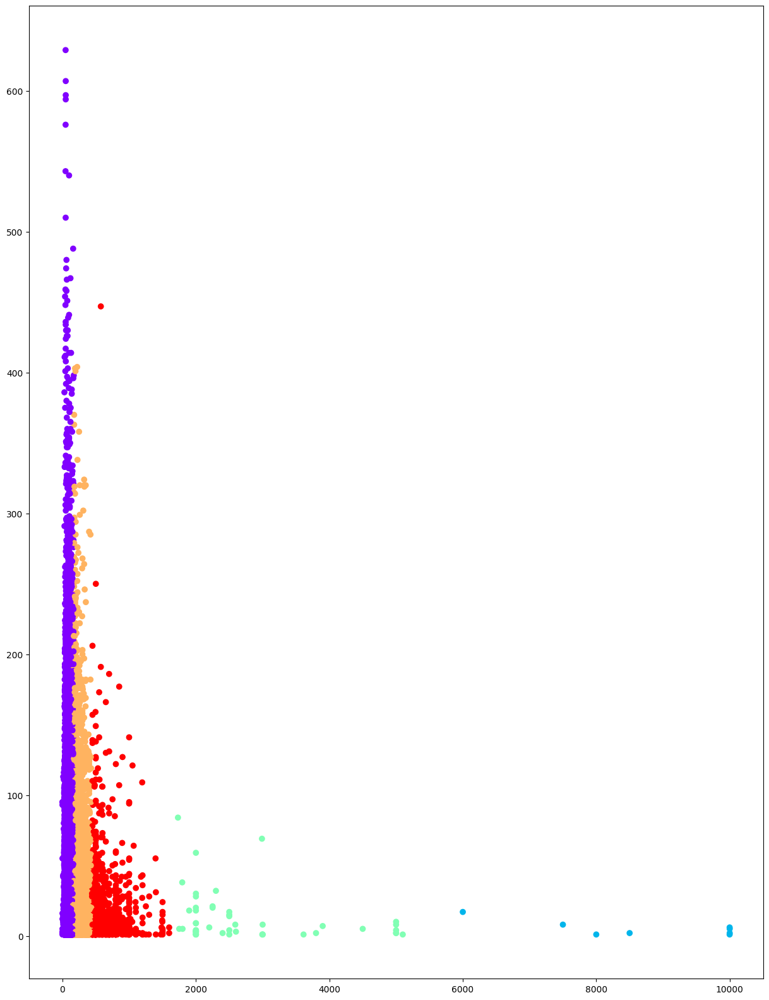

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.cluster import KMeans

x = airbnb.iloc[:, [6,8]].values
print(x)
kmeans2 = KMeans(n_clusters=5)
y_kmeans2 = kmeans2.fit_predict(x)
print(y_kmeans2)

kmeans2.cluster_centers_
print(x[:,0])
print(x[:,1])
plt.scatter(x[:,0], x[:,1], c=y_kmeans2, cmap='rainbow')


#<font color = "bright red">KNN to be able to classify the data based on it's Borough 

<font color = "red">First of all,getting rid of the NAN values to be able to perform KNN smoothly. 

In [ ]:
new_airbnb = new_airbnb.loc[~new_airbnb["borough_numeric"].isna()]
new_airbnb = new_airbnb.loc[~new_airbnb["room_type_numeric"].isna()]
new_airbnb = new_airbnb.loc[~new_airbnb["price"].isna()]

<font color = "red">Standardazing the values as it wouldn't make sense to compare different parameters with completely different ranges.

In [ ]:
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import accuracy_score
from sklearn.neighbors import KNeighborsClassifier
scaler = StandardScaler()
scaler.fit(new_airbnb.values)
mean = scaler.mean_
std = scaler.scale_

df_standart_airbnb = scaler.transform(new_airbnb.values)
df_standart_airbnb

array([[-1.4665262 , -0.45448937,  0.03392885, ..., -1.05458415,
         0.26523909,  0.70661304],
       [ 0.46347474, -0.69863238,  0.41982714, ...,  0.80535102,
        -0.90525419, -1.31164548],
       [-0.78185141, -0.18443295, -0.27072769, ...,  0.80535102,
         0.26523909,  0.0338602 ],
       ...,
       [-3.38870748, -4.10335646,  0.47060323, ..., -1.05458415,
         2.60622563,  0.70661304],
       [ 1.45002473,  0.5814051 , -0.21487399, ...,  0.80535102,
         3.7767189 ,  1.37936588],
       [-0.54707979,  0.49552673, -0.57030662, ..., -1.05458415,
         0.26523909,  0.0338602 ]])

<font color = "red">As the parameter we are concerned is the room type we are transforming the values into int.

In [ ]:
df_airbnb_new= pd.DataFrame(df_standart_airbnb,columns=["latitude",	"longitude",	"price",	"minimum_nights", "number_of_reviews",	"reviews_per_month",	"calculated_host_listings_count",	"availability_365",	"room_type_numeric",	"borough_numeric"])
df_airbnb_new
df_airbnb_new["borough_numeric"] = df_airbnb_new["borough_numeric"].astype(int)
df_airbnb_new

,latitude,longitude,price,minimum_nights,number_of_reviews,reviews_per_month,calculated_host_listings_count,availability_365,room_type_numeric,borough_numeric
0,-1.466526,-0.454489,0.033929,-0.280022,-0.421236,-0.692221,0.031775,1.930781,-1.054584,0
1,0.463475,-0.698632,0.419827,-0.280022,0.325873,-0.591055,-0.120343,1.853585,0.805351,0
2,-0.781851,-0.184433,-0.270728,-0.280022,4.995303,1.944025,-0.158373,0.610745,0.805351,0
3,1.279811,0.153298,-0.316426,0.237679,-0.421236,-0.757680,-0.158373,-0.886839,0.805351,0
4,0.355272,-0.510814,0.292887,-0.164977,0.927711,-0.466087,-0.158373,0.108977,0.805351,0
...,...,...,...,...,...,...,...,...,...,...
38838,0.961205,-0.053795,-0.067623,-0.280022,-0.587260,-0.222100,-0.158373,0.247928,-1.054584,0
38839,0.416557,2.924535,-0.494142,-0.280022,-0.587260,-0.222100,0.031775,1.730073,-1.054584,1
38840,-3.388707,-4.103356,0.470603,-0.280022,-0.587260,-0.222100,-0.158373,-0.215242,-1.054584,2
38841,1.450025,0.581405,-0.214874,-0.280022,-0.566507,0.372989,-0.158373,-0.578059,0.805351,3


<font color = "red">Splitting the data %80 for training and %20 for test size.,then calculating the test scores.

<font color ="magenta">Below our data will be consisted of price,number of reviews and room type numeric.We will be looking at the distribution of our data according to the borough of the airbnbs and see which distance function is the best to use after doing hyperparamater tuning.Also,we only took the first 500 data of airbnb to be able to work with it easily.

In [ ]:
import numpy as np
from sklearn.metrics import roc_auc_score

X = df_airbnb_new.iloc[0:1000,[2,4]].values


y = df_airbnb_new.iloc[0:1000,[9]].values

from sklearn.model_selection import train_test_split

X_train, X_remaining, y_train, y_remaining = train_test_split(X, y, test_size=0.20, random_state=0)

# 10% validation, 10% test
X_test, X_val, y_test, y_val = train_test_split(X_remaining, y_remaining, test_size=0.50, random_state=0)


In [ ]:
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import classification_report
from sklearn.model_selection import train_test_split
from sklearn.metrics import roc_auc_score
from sklearn.model_selection import GridSearchCV
from sklearn.linear_model import LogisticRegression

#List Hyperparameters that we want to tune.
leaf_size = list(range(1,50))
n_neighbors = list(range(1,30))
p=[1,2]
#Convert to dictionary
hyperparameters = dict(leaf_size=leaf_size, n_neighbors=n_neighbors, p=p)
#Create new KNN object
knn_2 = KNeighborsClassifier()
#Use GridSearch
clf = GridSearchCV(knn_2, hyperparameters, cv=10)
#Fit the model
best_model = clf.fit(X,y)
#Print The value of best Hyperparameters
print('Best leaf_size:', best_model.best_estimator_.get_params()['leaf_size'])
print('Best p:', best_model.best_estimator_.get_params()['p'])
print('Best n_neighbors:', best_model.best_estimator_.get_params()['n_neighbors'])

Best leaf_size: 1
Best p: 1
Best n_neighbors: 7


<font color ="magenta">Above we have done hyperparameter testing and the results show us that the best number of leaf size is 1 and the optimal distance method is Manhattan(p=1).The most optimal number for k is 2 so we will train our data according to that.

<font color = "red">We only wanted to extract the price and number of reviews columns for X to better classify the airbnb data as it has a higher accuracy score compared to other methods and we printed out the accuracy scores of this which is quite high borough numeric is correlated with price and number of reviews so the nearest neighbour algorithm should be effected.

In [ ]:
X = df_airbnb_new.iloc[0:1000,[2,4]].values


y = df_airbnb_new.iloc[0:1000,[9]].values

from sklearn.model_selection import train_test_split
X_train, X_remaining, y_train, y_remaining = train_test_split(X, y, test_size=0.20, random_state=0)

# 10% validation, 10% test
X_test, X_val, y_test, y_val = train_test_split(X_remaining, y_remaining, test_size=0.50, random_state=0)
k=7
# generate the model
euclidean_airbnb = KNeighborsClassifier(k, metric="euclidean")

euclidean_airbnb.fit(X_train, y_train)
# predict the validation data
y_pred = euclidean_airbnb.predict(X_test)
# obtain the accuracy value
print(f"{accuracy_score(y_test, y_pred):.2f}")


chebyshev_airbnb = KNeighborsClassifier(k, metric="chebyshev")

chebyshev_airbnb.fit(X_train, y_train)
# predict the validation data
chebyshev_airbnb = chebyshev_airbnb.predict(X_test)
# obtain the accuracy value
print(f"{accuracy_score(y_test, y_pred):.2f}")

manhattan_airbnb = KNeighborsClassifier(k, metric= "manhattan")

manhattan_airbnb.fit(X_train, y_train)
# predict the validation data
y_pred = manhattan_airbnb.predict(X_test)
# obtain the accuracy value
print(f"{accuracy_score(y_test, y_pred):.2f}")

0.94
0.94
0.94


<font color ="magenta">Above looking at the accuracy scores of models,after standardizing the values,all of them have the same accuracy score and the accuracy score of the predicted data is very high.

<font color = "red">Now visualizing the models we have created and deciding which model is the best from mainly looking at the boundaries.

In [ ]:
from matplotlib.colors import ListedColormap
from ipywidgets import interact

def visualize_model(model, ax, title):
  step = 0.05

  cmap_light = ListedColormap(['orange', 'cyan', 'cornflowerblue'])
  cmap_bold = ListedColormap(['darkorange', 'c', 'darkblue'])

  data = df_airbnb_new.iloc[0:500,[2,4]].values
  labels = df_airbnb_new.iloc[0:500,[9]].values


  model.fit(data, labels)

  x_min = data[:, 0].min() - 1
  x_max = data[:, 0].max() + 1
  y_min = data[:, 1].min() - 1
  y_max = data[:, 1].max() + 1

  xx, yy = np.meshgrid(np.arange(x_min, x_max, step), np.arange(y_min, y_max, step))
  y_pred = model.predict(np.hstack([xx.reshape(-1,1), yy.reshape(-1,1)])).reshape(xx.shape)

  ax.pcolormesh(xx, yy, y_pred, cmap=cmap_light)
  ax.scatter(data[:, 0], data[:, 1], c=labels, cmap=cmap_bold, edgecolor='k', s=20)
  ax.set_xlim(xx.min(), xx.max())
  ax.set_ylim(yy.min(), yy.max())
  ax.set_title(title)

In [ ]:
from sklearn.neighbors import KNeighborsClassifier
k=2
model_euc = KNeighborsClassifier(k, metric="manhattan",leaf_size=1,p=1)
print(model_euc)

KNeighborsClassifier(algorithm='auto', leaf_size=1, metric='manhattan',
                     metric_params=None, n_jobs=None, n_neighbors=2, p=1,
                     weights='uniform')


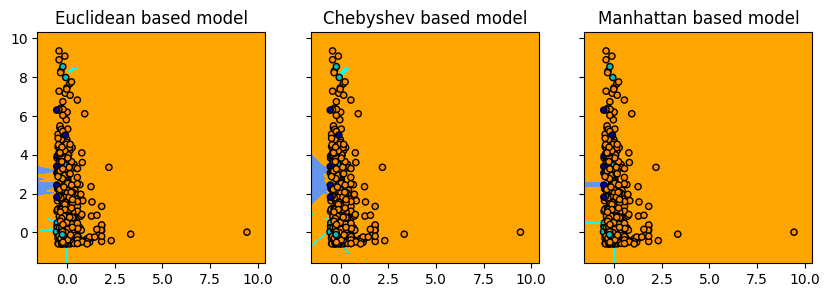

In [ ]:
from sklearn.neighbors import KNeighborsClassifier


# set the hyperparameter k
k=2
# generate the model
model_euc = KNeighborsClassifier(k, leaf_size=1,metric="euclidean",p=2)
model_Che = KNeighborsClassifier(k,leaf_size=1, metric="chebyshev",)
model_Man = KNeighborsClassifier(k, leaf_size=1,metric= "manhattan",p=1)
fig, axs = plt.subplots(1, 3, figsize=(10, 3), sharey=True)
visualize_model(model_euc,axs[0],"Euclidean based model")
visualize_model(model_Che, axs[1] , "Chebyshev based model")
visualize_model(model_Man, axs[2] , "Manhattan based model" )

<font color = "red">From the three models we see above it is clearly seen that these models are not the best to classify our data as we have a very big data and we cannot see clearly the points.Even though it is not visibly completely clear the judging from looking at a few point,the manhattan based model looks more accurate compared to euclidean based and chebyshev based model which both look relatively similar.

#<font color="pink">Predicting Number of Reviews According to Price using Linear Regression

In [ ]:
import pandas as pd  
import numpy as np  
import matplotlib.pyplot as plt  
import seaborn as seabornInstance 
from sklearn.model_selection import train_test_split 
from sklearn.linear_model import LinearRegression
from sklearn import metrics
%matplotlib inline

<font color="cyan">First we plotted the price and number of reviews in a scatter plot to be able to see the distribution better.

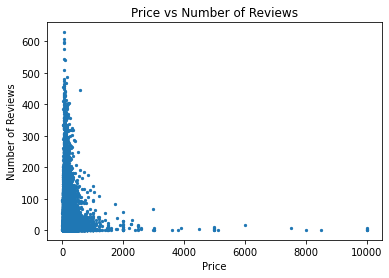

In [ ]:
from sklearn.model_selection import train_test_split 
from sklearn.linear_model import LinearRegression
from sklearn import metrics
from os.path import join

new_airbnb.plot.scatter(x="price", y="number_of_reviews", s=5)  
plt.title("Price vs Number of Reviews")  
plt.xlabel("Price")  
plt.ylabel("Number of Reviews")  
plt.show()

<font color="cyan">We have already plotted the scatter plot of number of reviews and price and we already know that they are negatively correlated to each other so that means the R value will be negatively plotted afterwards.Now we will train our data and try to predict the number of reviews solely according to the price.

<font color="indigo">Now we are assigning the x and y variables to price and number of reviews columns.

In [ ]:
X = new_airbnb['price'].values.reshape(-1,1)
y = new_airbnb['number_of_reviews'].values.reshape(-1,1)

<font color="red">We are splitting our data %80 of the data will be assigned for training and %20 of the data will be assigned for the test.

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=0)

In [ ]:
regressor = LinearRegression()  
regressor.fit(X_train, y_train) #training the algorithm

LinearRegression(copy_X=True, fit_intercept=True, n_jobs=None, normalize=False)

<font color="red">The regression model is trying to find the best value for the slope and the value of intercept.The results below are respectively 30.5 and -0.008 which means that for every 3 unit of change in the price results in the %-0.008 change in the number of reviews.They are again seen negatively correlated.

In [ ]:
#To retrieve the intercept:
print(regressor.intercept_)
#For retrieving the slope:
print(regressor.coef_)

[30.5643018]
[[-0.00859282]]


In [ ]:
y_pred = regressor.predict(X_test)

<font color="brick">Now we can see below the predictions we have made for the number of reviews and it's distribution in a bar chart.The bar chart below shows us that the actual number of reviews and the predicted ones are very far from each other meaning that they are not solely dependent on each other.Again,we are concluding like our k-means clustering modelwe have implemented before,that the price and the number of reviews are not strongly correlated with each other and they are many other factors that effect the data.

In [ ]:
df = pd.DataFrame({'Actual': y_test.flatten(), 'Predicted': y_pred.flatten()})
df

,Actual,Predicted
0,4,27.479479
1,2,29.146486
2,4,30.091697
3,18,30.091697
4,9,29.189450
...,...,...
7764,3,29.198043
7765,14,29.919840
7766,44,30.048732
7767,1,29.919840


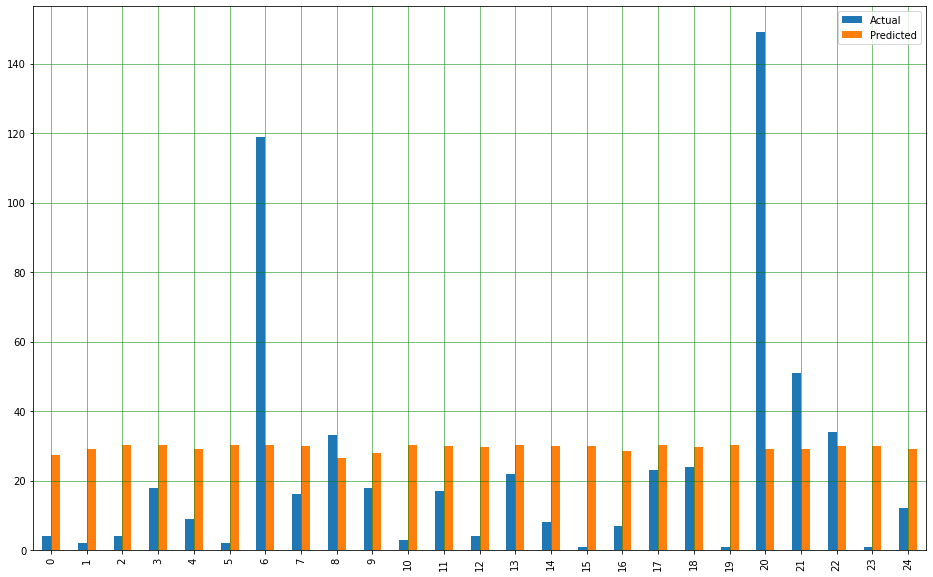

In [ ]:
df1 = df.head(25)
df1.plot(kind='bar',figsize=(16,10))
plt.grid(which='major', linestyle='-', linewidth='0.5', color='green')
plt.grid(which='minor', linestyle=':', linewidth='0.5', color='black')
plt.show()

<font color="cyan">Now finally plotting R^2 in our plot and seeing the slight negative correlation between these two parameters.

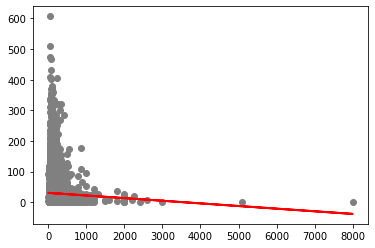

In [ ]:
plt.scatter(X_test, y_test,  color='gray')
plt.plot(X_test, y_pred, color='red', linewidth=2)
plt.show()

In [ ]:
print('Mean Absolute Error:', metrics.mean_absolute_error(y_test, y_pred))  
print('Mean Squared Error:', metrics.mean_squared_error(y_test, y_pred))  
print('Root Mean Squared Error:', np.sqrt(metrics.mean_squared_error(y_test, y_pred)))

Mean Absolute Error: 31.04905206171339
Mean Squared Error: 2361.052311705939
Root Mean Squared Error: 48.59066074572293


<font color="red">As we are dealing with a big data the metrics above can be more than expected but the values above are not looking good at all meaning that our predictions will not be accurate.We cannot trust making a regression model between these two parameters and trust our predictions.

#<font color="bright pink">Clustering the latitude longitude of subway entrances using K-Means Clustering

In [ ]:
subway1 = subway1.round({"Station latitude":4, "Station longitude":4})
subway1

,OBJECTID,URL,NAME,the_geom,Station longitude,Station latitude,LINE
0,"1,734",http://web.mta.info/nyct/service/,Birchall Ave & Sagamore St at NW corner,NaN,-73.8684,40.8492,5-Feb
1,"1,735",http://web.mta.info/nyct/service/,Birchall Ave & Sagamore St at NE corner,NaN,-73.8682,40.8491,5-Feb
2,"1,736",http://web.mta.info/nyct/service/,Morris Park Ave & 180th St at NW corner,NaN,-73.8735,40.8412,5-Feb
3,"1,737",http://web.mta.info/nyct/service/,Morris Park Ave & 180th St at NW corner,NaN,-73.8729,40.8415,5-Feb
4,"1,738",http://web.mta.info/nyct/service/,Boston Rd & 178th St at SW corner,NaN,-73.8796,40.8408,5-Feb
...,...,...,...,...,...,...,...
1923,"1,928",http://web.mta.info/nyct/service/,2nd Ave & bet 83rd & 84th St,NaN,-73.9528,40.7762,Q
1924,"1,929",http://web.mta.info/nyct/service/,2nd Ave & 96th St at SW corner,NaN,-73.9475,40.7841,Q
1925,"1,930",http://web.mta.info/nyct/service/,2nd Ave & 95th St at NW corner,NaN,-73.9476,40.7839,Q
1926,"1,931",http://web.mta.info/nyct/service/,2nd Ave & 94th St at NE corner,NaN,-73.9477,40.7829,Q


In [ ]:
import numpy as np
subway1["Station latitude"] = np.radians(subway1["Station latitude"])
subway1["Station longitude"] = np.radians(subway1["Station longitude"])

In [ ]:

from sklearn.cluster import KMeans ,AgglomerativeClustering

# creates 5 clusters using hierarchical clustering.
agc = AgglomerativeClustering(n_clusters =5, affinity='euclidean', linkage='ward')
subway1['pickup cluster'] = agc.fit_predict(subway1[['Station latitude','Station longitude']])

# creates 5 clusters using k-means clustering algorithm.
kmeans = KMeans(5)
clusters = kmeans.fit_predict(subway1[['Station latitude','Station longitude']])
subway1['pickup cluster'] = kmeans.predict(subway1[['Station latitude','Station longitude']])
print(clusters)

kmeans.cluster_centers_

[3 3 3 ... 1 1 1]


array([[ 0.70774626, -1.29441072],
       [ 0.7110771 , -1.29118275],
       [ 0.70947489, -1.29114962],
       [ 0.71276196, -1.28998696],
       [ 0.71023434, -1.28895078]])

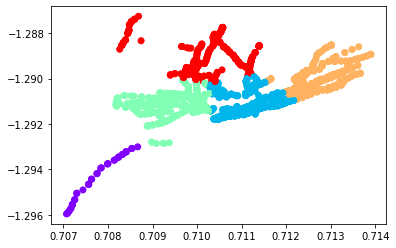

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.cluster import KMeans


plt.scatter(subway1['Station latitude'], subway1['Station longitude'], c=clusters, cmap='rainbow')

#<font color="red">Clustering the locations of events in NYC using K-Means Clustering

In [ ]:
import numpy as np
events["Latitude"] = np.radians(events["Latitude"])
events["Longitude"] = np.radians(events["Longitude"])

In [ ]:

from sklearn.cluster import KMeans ,AgglomerativeClustering

# creates 5 clusters using hierarchical clustering.
agc = AgglomerativeClustering(n_clusters =5, affinity='euclidean', linkage='ward')
events['pickup cluster'] = agc.fit_predict(events[['Latitude','Longitude']])

# creates 5 clusters using k-means clustering algorithm.
kmeans = KMeans(5)
clusters = kmeans.fit_predict(events[['Latitude','Longitude']])
events['pickup cluster'] = kmeans.predict(events[['Latitude','Longitude']])
print(clusters)

kmeans.cluster_centers_

[2 4 0 ... 3 1 2]


array([[ 0.71084044, -1.29118553],
       [ 0.71047639, -1.28840036],
       [ 0.70934849, -1.29068432],
       [ 0.71266796, -1.28992379],
       [ 0.7085886 , -1.29375814]])

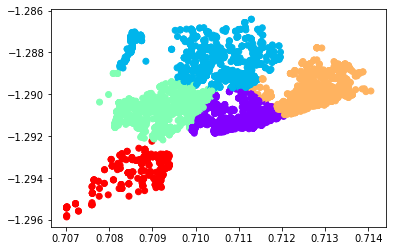

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.cluster import KMeans


plt.scatter(events['Latitude'], events['Longitude'], c=clusters, cmap='rainbow')

#<font color="red">Clustering the airbnb locations using k-means clustering

In [ ]:
import numpy as np
new_airbnb["latitude"] = np.radians(new_airbnb["latitude"])
new_airbnb["longitude"] = np.radians(new_airbnb["longitude"])

In [ ]:

from sklearn.cluster import KMeans ,AgglomerativeClustering

# creates 5 clusters using hierarchical clustering.
agc = AgglomerativeClustering(n_clusters =5, affinity='euclidean', linkage='ward')
new_airbnb['pickup cluster'] = agc.fit_predict(new_airbnb[['latitude','longitude']])

# creates 5 clusters using k-means clustering algorithm.
kmeans = KMeans(5)
clusters = kmeans.fit_predict(new_airbnb[['latitude','longitude']])
new_airbnb['pickup cluster'] = kmeans.predict(new_airbnb[['latitude','longitude']])
print(clusters)

kmeans.cluster_centers_

[3 0 2 ... 3 4 2]


array([[ 0.71103478, -1.29131142],
       [ 0.71053413, -1.28839465],
       [ 0.71030349, -1.29044226],
       [ 0.70956686, -1.29126277],
       [ 0.71217952, -1.2904665 ]])

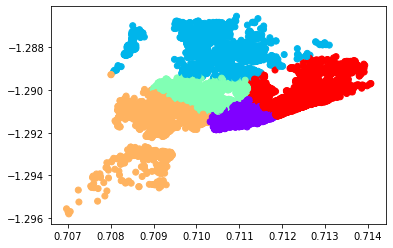

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.cluster import KMeans


plt.scatter(new_airbnb['latitude'], new_airbnb['longitude'], c=clusters, cmap='rainbow')

<font color="magenta">Looking at the k-means clustering of airbnb,subway and events datasets visibly all three locations match with each other especially the events dataset's locations and the airbnb locations are clustered very similarly meaning that where the airbnb locations are strategically correlated with the locations of events.The events of NYC are mostly done in places that the places can accomodate people coming outside of NYC.

#<font color ="red">Predicting the price of airbnb according to boroughs of airbnbs

<font color="blue">Below we have tried to implement the regression model using the the first 500 data of prices and the first 500 data of airbnb boroughs as our data is too big to implement training

In [ ]:
new_airbnb = new_airbnb.loc[~new_airbnb["price"].isna()]

X = airbnb.iloc[0:500,[14]].values.reshape(-1,1)
y = airbnb.iloc[0:500,[6]].values.reshape(-1,1)
print(len(X))
print(len(y))

500
500


In [ ]:
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import classification_report
from sklearn.model_selection import train_test_split
from sklearn.metrics import roc_auc_score
from sklearn.model_selection import GridSearchCV
from sklearn.linear_model import LogisticRegression

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=0)
print(len(X_train))

print(len(y_train))

400
400


In [ ]:
from sklearn.linear_model import LinearRegression

regressor = LinearRegression()  
regressor.fit(X_train, y_train) #training the algorithm

LinearRegression(copy_X=True, fit_intercept=True, n_jobs=None, normalize=False)

<font color="green">Below we can see the intercept and the slope of our regression model and our regression coefficient is highly negatively correlated meaning that when the "borough_numeric"  parameter increases,the "price" parameter decreases.To remind that the numeric values of "borough_numeric"column is as follows;
0-Manhattan
1-Brooklyn
2-Queens
3-Staten Island
4-Bronx

In [ ]:
#To retrieve the intercept:
print(regressor.intercept_)
#For retrieving the slope:
print(regressor.coef_)

[171.75721329]
[[-27.09149014]]


In [ ]:
y_pred = regressor.predict(X_test)

In [ ]:
df = pd.DataFrame({'Actual': y_test.flatten(), 'Predicted': y_pred.flatten()})
df

,Actual,Predicted
0,105,144.665723
1,135,144.665723
2,85,171.757213
3,89,144.665723
4,190,171.757213
...,...,...
95,110,117.574233
96,375,171.757213
97,42,117.574233
98,52,171.757213


<font color ="green">The figure below looks like the predicted values of prices are sometimes consistent with the actual values but sometimes there is a huge gap.But overall,the actual values and predicgted values are not close to each other.  

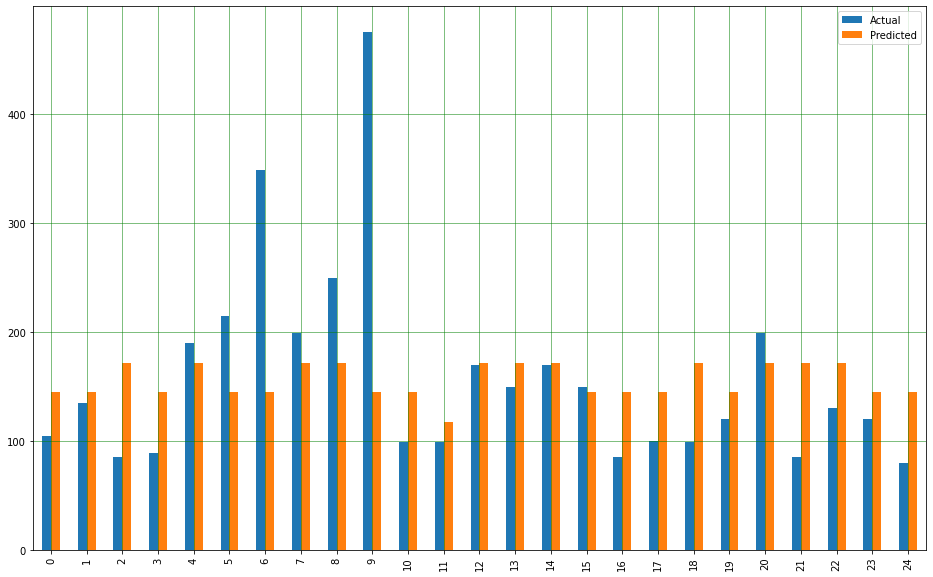

In [ ]:
df1 = df.head(25)
df1.plot(kind='bar',figsize=(16,10))
plt.grid(which='major', linestyle='-', linewidth='0.5', color='green')
plt.grid(which='minor', linestyle=':', linewidth='0.5', color='black')
plt.show()

<font color="blue">Below we can see the regression plot and it is clearly seen that when the prices increase the borough numeric number decreases.We still have to keep in mind that the values are not all of the data it is only a small portion of the data so there might be a chance that this plot might not be the same when the whole data is included. 

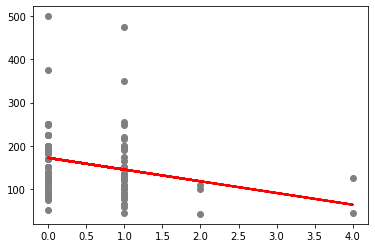

In [ ]:
plt.scatter(X_test, y_test,  color='gray')
plt.plot(X_test, y_pred, color='red', linewidth=2)
plt.show()

<font color="red">Just like the other linear regression model our errors are not very trusting,meaning that we cannot just predict the prices according to their boroughs.

In [ ]:

from sklearn import metrics
%matplotlib inline

print('Mean Absolute Error:', metrics.mean_absolute_error(y_test, y_pred))  
print('Mean Squared Error:', metrics.mean_squared_error(y_test, y_pred))  
print('Root Mean Squared Error:', np.sqrt(metrics.mean_squared_error(y_test, y_pred)))

Mean Absolute Error: 54.16469320672023
Mean Squared Error: 5768.9523914817755
Root Mean Squared Error: 75.95362000248424


### Results & Discussion

#<font color="blue">
Data Visualization:
</font>

After the dataset's are provided and prepared for our project we wanted to indicate if there was a correlation between Airbnb and NYC events, subways lines.
As you can see from maps It is clear there is a correlation between the subways lines and events with Airbnb places' locations. But we should state that, in this step it is not possible for us to see if there is any causation... We will state it with dataset's internals by looking deeper.

#<font color="blue">
Clustering with the help of price and number reviews:
</font>


<table>
  <thead>
    <tr>
      <th><font color="magenta"></th>
      <th><font color="magenta">Cluster Center 0</th>
      <th><font color="magenta">Cluster Center 1</th>
    </tr>
  </thead>
  <tbody>
    <tr>
      <td><font color="tomato">Number of Reviews</td>
      <td><font color="darkorange">15.57598661.</td>
      <td><font color="darkorange">143.1153386</td>
    </tr>
    <tr>
      <td><font color="tomato">Prices</td>
      <td><font color="darkorange">139.3984546</td>
      <td><font color="darkorange">6439.5</td>
    
    </tr>
  </tbody>
</table>

Set1: the one with less price, more reviews.

Set2: the one with less price, less reviews


Set3: the one with more price, less reviews.

Set4: the one with more price, more reviews

We already know that the prices and number of reviews parameters are negatively correlated.But we want to further see the intersection those high-priced airbnbs and the low views group having many common elements.

From the output above it is clearly seen that "set2" have many more elements compared to the other sets implemented.The cluster center of the price array in "set2" is the one with the less priced center and the cluster center of the number of reviews in "set2" is the one with the less reviews.So it is clearly seen that these two parameters are not dependent solely on each other.If the data is seen closely and also from the data visualization that we have done before the neighborhood of the airbnb is an important factor on the reviews.But also the set "set1" confirms the cases that the prices were effective on the number of reviews and also "set4" has 0 elements which means the cluster having the most priced houses doesn't have any intersecting elements with the high number parameter."set3" parameter has rather less elements compared to "set1" and "**set2**" which is the case where some high priced airbnbs had rather more number of reviews.Again there may be other factors attracting the people to look at these houses.

---

#<font color="blue">
Knn and Machine Learning: 
</font>

While the classification of price values with Borough's numerical values is implemented from 2% of the data as a sample, we tried to implement KNN. Before that, we standardized the datasets and labels.We first did hyperparameter tunning to be able to obtain the best parameters for our K-Neighbors classifier implementation. After observing the resulting classifications we train our data with a **machine lerning algorithm** that founds the euclidean, chebyshev and manhattan distances. Our hyperparamter tuning results suggested that the best distance algorithm would be manhattan. We also set the k-value to 7 after hyperParameter said it shoud be that way, it also showed that leaf-size should be set to 1.
As a result it is stated that the Borough parameter can be a good way to be able to classify our data but this doesn't always mean that all of our data will be classified accurately as we could only classify 2% of the data.We can only see if this classification would be accurate trying to predict the prices from the boroughs.

---

#<font color="blue">
Predicting Number of Reviews According to Price using Linear Regression:
</font>

The regression model is trying to find the best value for the slope and the value of intercept.The results below are respectively 30.5 and -0.008 which means that for every 3 unit of change in the price results in the %-0.008 change in the number of reviews.They are __again_ seen **negatively correlated.**

Mean Absolute Error: 31.04905206171339
Mean Squared Error: 2361.052311705939
Root Mean Squared Error: 48.59066074572293

As we are dealing with a big data the metrics above can be more than expected but the values above are not looking good at all meaning that our predictions will not be accurate.We **cannot** trust making a regression model between these two parameters and trust our predictions.

---

#<font color="blue">
Clustring airbnb locations using K-Means:
</font>

Finally, we will use __K-means clustring__ for locations with the informations from the additional datasets. The implementation here is a part of the achine lerning algorithm that will let us see the correlation between groups of the datasets, one more time, easily and _numerically_.
As expected, we observed very implicit relations between datasets.

---
#<font color="blue">
Price prediction by boroughs with Linear regression:
</font>

* Mean Absolute Error: 54.16469320672023
* Mean Squared Error: 5768.9523914817755
* Root Mean Squared Error: 75.95362000248424

* regression coefficient :: 27.09149014

We observed, although sometimes there is a correlation between boroughs and prices, it doesn't mean there is a causation. Since the predicted values are not precisely accurate, and there is a big Mean-error value, we can state that there is no possibilty for algorithm to predict accurate prices with just Borough information.



---


**Note**: There is 2 different subway entrances dataset. Although they are the same, the second one has a numerical values for locations while the first one has its own structural objects(Point). 


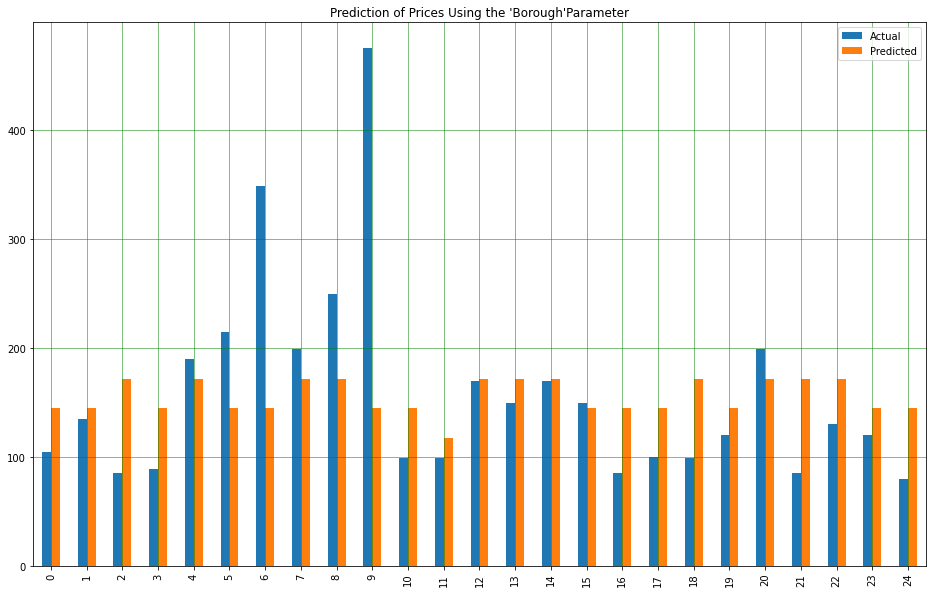

In [ ]:
df1 = df.head(25)
df1.plot(kind='bar',figsize=(16,10))
plt.grid(which='major', linestyle='-', linewidth='0.5', color='green')
plt.grid(which='minor', linestyle=':', linewidth='0.5', color='black')

plt.title("Prediction of Prices Using the 'Borough'Parameter")
plt.show()

## Conclusion

<font color="magenta">
To sum up,the airbnb data parameters are all dependent on each other in a way that,no parameter can be separated to be able to predict other parameter in the dataset.For example,we wanted to predict the prices of airbnbs using only the borough parameter,since the price parameter is not only affected from the change of the borough parameter,machine learning techniques using that is not very accurate.Another important thing that we have observed is that by doing k-means clustering of prices and number of reviews we have concluded that the price paramater is not only affected from the review parameter.The different parameters of this dataset is inseparable.To add,there might be other factors besides this dataset that affects the prices,such as attractions surrounding the place.We have also observed that the events clustering and airbnb clustering is very similar to each other,in a way that it looks like the events in NYC have been located according to the airbnb concentration in the area.The subway data has shown us from data visualization that the event locations are not always so close to subway locations even though the subway network of NYC is one of the best in the world.Although we think that the subway system may not be so friendly,the clustering showed us that it is grouped very similarly to events location clustering and airbnb clustering.
